# Adverserial attacks
Ovaj notebook je podijeljen u 3 dijela
1. **White box napadi**
2. **Black box napadi**
3. **Odbrana**

In [218]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
import matplotlib.pyplot as plt
from keras.src.applications import VGG16
import foolbox as fb
import random
import tensorflow_datasets as tfds
import neural_structured_learning as nsl

Učitavamo podatke sa mnist dataseta

In [219]:
data = tf.keras.datasets.mnist
(X_train_mnist, Y_train_mnist), (X_test_mnist, Y_test_mnist) = data.load_data()

In [220]:
def prikazi_slike(slike, labele, crno_bijelo=False):
    if len(slike) != len(labele):
        return

    plt.figure(figsize=(5*len(slike), 5))
    if crno_bijelo:
        for i in range(len(slike)):
            plt.subplot(1, len(slike), i+1)
            plt.imshow(slike[i], cmap="grey")
            plt.title(labele[i])
            plt.axis("off")
    else:
        for i in range(len(slike)):
            plt.subplot(1, len(slike), i+1)
            plt.imshow(slike[i])
            plt.title(labele[i])
            plt.axis("off")

Prikazujemo slike nekih instanci iz mnist dataseta

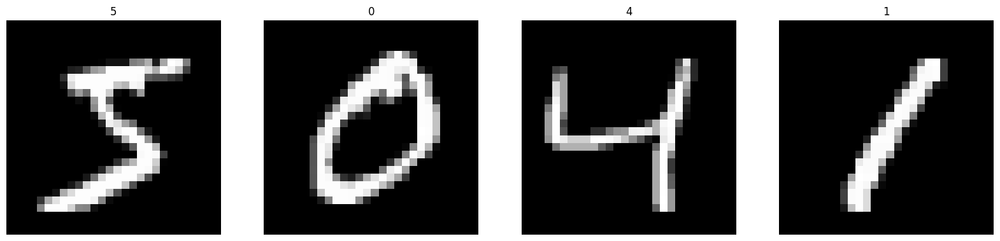

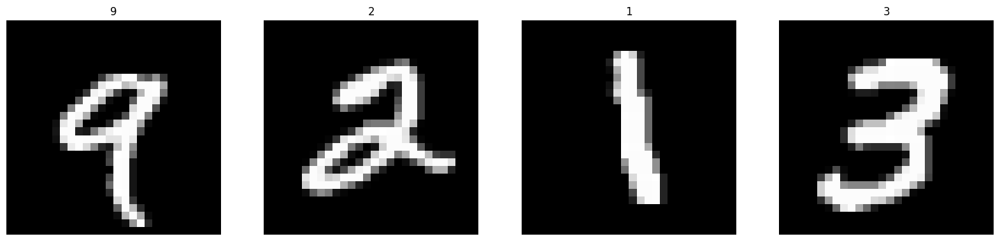

In [221]:
prikazi_slike(X_train_mnist[:4], Y_train_mnist[:4], True)
prikazi_slike(X_train_mnist[4:8], Y_train_mnist[4:8], True)

Ovo je model koji ćemo koristiti sa svim white box napadima, obična konvoluciona mreža sa regularizacijom preko dropouta

In [222]:
def napravi_sample_model(size=-1):
    model = tf.keras.models.Sequential()
    if size != -1:
        model.add(tf.keras.Input(size, name='feature'))
    model.add(tf.keras.layers.Conv2D(32, (3, 3), padding="same", activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Conv2D(64, (3, 3), padding="same", activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Conv2D(128, (3, 3), padding="same", activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(512, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Dense(256, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Dense(128, activation='relu'))
    model.add(tf.keras.layers.Dense(10, activation='softmax'))
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

def iscrtaj_model(history):
    plt.plot(history.history["loss"], label="trening loss")
    plt.plot(history.history["val_loss"], label="validation loss")
    plt.title("Progress treninga")
    plt.ylabel("accuracy/loss")
    plt.xlabel("epoch")
    plt.legend(loc="upper left")
    plt.show()

Pravimo i treniramo model

In [223]:
mali_mnist = napravi_sample_model()

In [224]:
X_train_mnist, X_test_mnist = X_train_mnist / 255.0, X_test_mnist / 255.0
X_train_mnist = X_train_mnist.reshape((X_train_mnist.shape[0], 28, 28, 1))
X_test_mnist = X_test_mnist.reshape((X_test_mnist.shape[0], 28, 28, 1))

In [225]:
hist = mali_mnist.fit(X_train_mnist, Y_train_mnist, validation_data=(X_test_mnist, Y_test_mnist), epochs=5, batch_size=256)

Epoch 1/5
235/235 [==============================] - 9s 33ms/step - loss: 0.4744 - accuracy: 0.8406 - val_loss: 0.0663 - val_accuracy: 0.9799
Epoch 2/5
235/235 [==============================] - 7s 32ms/step - loss: 0.1101 - accuracy: 0.9669 - val_loss: 0.0430 - val_accuracy: 0.9871
Epoch 3/5
235/235 [==============================] - 7s 32ms/step - loss: 0.0803 - accuracy: 0.9758 - val_loss: 0.0306 - val_accuracy: 0.9904
Epoch 4/5
235/235 [==============================] - 7s 31ms/step - loss: 0.0637 - accuracy: 0.9806 - val_loss: 0.0285 - val_accuracy: 0.9911
Epoch 5/5
235/235 [==============================] - 7s 31ms/step - loss: 0.0576 - accuracy: 0.9820 - val_loss: 0.0252 - val_accuracy: 0.9915


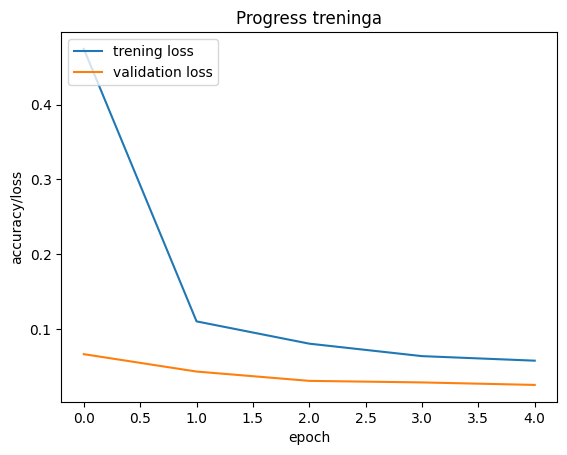

In [226]:
iscrtaj_model(hist)

# White box napad
Sada pravimo pomoćne funkcije za white box napad

In [227]:
#ova funkcija samo uzima vjerovatnocu i klasu koju pogađa neki model
def uzmi_pred_labelu(slika, model):
        predikcija = model.predict(slika)[0]
        najbolja_klasa = 0
        najbolja_vjerovatnoca = 0
        for i in range(len(predikcija)):
            if predikcija[i] > najbolja_vjerovatnoca:
                najbolja_vjerovatnoca = predikcija[i]
                najbolja_klasa = i

        return najbolja_klasa, najbolja_vjerovatnoca

#Fiksiramo model i mijenjamo sliku tako da se predikcija sve više udaljava od onoga što treba biti
#Funckija vraca koliko se vrijednost svakog pixel treba promijenit da bi se sto vise promjenio prediction
def generisi_gradijent_pomjeranja(slika, labela_slike, model, target_index=-1, broj_iteracija=100, eps=0.0005):
    loss_func = tf.keras.losses.SparseCategoricalCrossentropy()
    optimizer = tf.keras.optimizers.Adam(learning_rate=eps)
    pomjeranja = tf.Variable(tf.zeros_like(slika), trainable=True)
    for i in range(broj_iteracija):
        with tf.GradientTape() as tape:
            tape.watch(pomjeranja)
            input = slika + pomjeranja
            input = tf.clip_by_value(input, clip_value_min=0, clip_value_max=1.0) #Gradijent moze biti negativan pa moramo paziti da ne predictamo sa negativnim brojevima
            prediction = model(input, training=False)
            if target_index == -1:
                loss = - loss_func(tf.convert_to_tensor([labela_slike]),prediction)
            else:
                loss = loss_func(tf.convert_to_tensor([target_index]),prediction) #Ovo sluzi ako zelimo da ciljamo koju vrijednost da klasificira umjesto one koju treba

        gradijenti = tape.gradient(loss, pomjeranja)
        optimizer.apply_gradients([(gradijenti, pomjeranja)])
        pomjeranja.assign_add(tf.clip_by_value(pomjeranja, clip_value_min=-eps, clip_value_max=eps))

    return pomjeranja

#Popravljamo dimenzije i sabiramo sliku i gradijent promjene koji smo dobili iz funkcije generisi_gradijent_pomjeranja
def uradi_napad(slika, labela_slike, model, target_index=-1, broj_iteracija=100, eps=0.0005):
    slika = np.array([slika])
    tf_img = tf.convert_to_tensor(slika)
    tf_img = tf.clip_by_value(tf_img, clip_value_min=0, clip_value_max=1)
    pomjeranja = generisi_gradijent_pomjeranja(tf_img, labela_slike, model, target_index, broj_iteracija, eps)

    nakon_napada_slika = tf_img + pomjeranja
    nakon_napada_slika = tf.clip_by_value(nakon_napada_slika, clip_value_min=0, clip_value_max=1)

    pomjeranja = tf.clip_by_value(pomjeranja, clip_value_min=0, clip_value_max=1)

    return tf_img, pomjeranja, nakon_napada_slika

#Vizualizirmo sve rezultate tako da vidimo orginalnu sliku, koje pixele mjenjamo i koju sliku dobijemo
def vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, labela_slike, model, to_index=lambda i : i, crno_bijelo=False):
    prije_napada_prediction, prije_napada_sigurnost = uzmi_pred_labelu(orginal, model)
    nakon_napada_predikcija, nakon_napada_sigurnost = uzmi_pred_labelu(nakon_napada_slika, model)
    labele = ["Prije napada True:{}, Pred:{}, Prob:{:.3f}".format(  to_index(labela_slike),
                                                                    to_index(prije_napada_prediction),
                                                                    round(prije_napada_sigurnost, 3)),
              "Patern",
              "Poslije napada True:{}, Pred:{}, Prob{:.3f}".format(to_index(labela_slike),
                                                            to_index(nakon_napada_predikcija),
                                                            round(nakon_napada_sigurnost, 3))
              ]
    min_val = np.min(pomjeranja)
    max_val = np.max(pomjeranja)

    pomjeranja = (pomjeranja - min_val) / (max_val - min_val)
    slike = [orginal[0], pomjeranja[0], nakon_napada_slika[0]]
    prikazi_slike(slike, labele, crno_bijelo)


**Rezultati mnista**

1/1 [==============================] - 0s 14ms/step


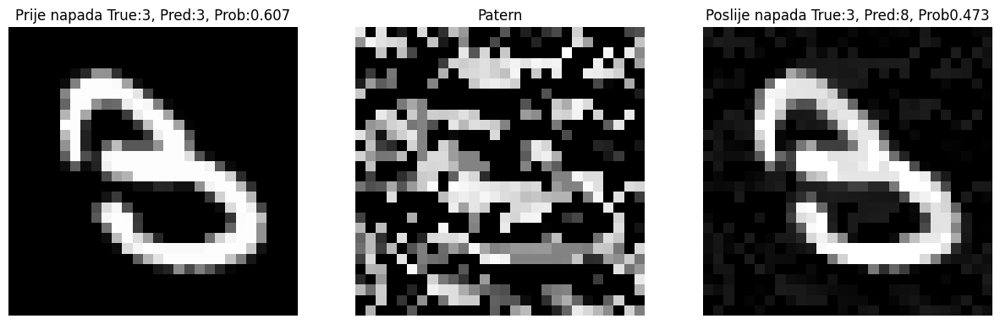

In [228]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_test_mnist[18], Y_test_mnist[18], mali_mnist)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_test_mnist[18], mali_mnist, crno_bijelo=True)

1/1 [==============================] - 0s 14ms/step


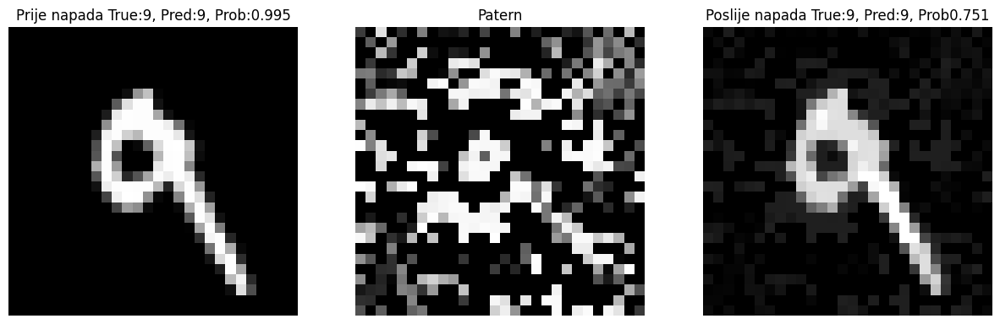

In [229]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_test_mnist[7], Y_test_mnist[7], mali_mnist)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_test_mnist[7], mali_mnist, crno_bijelo=True)

1/1 [==============================] - 0s 13ms/step


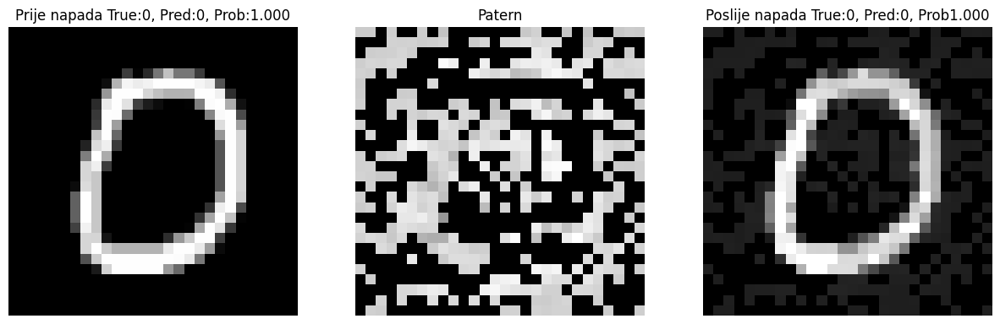

In [230]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_test_mnist[10], Y_test_mnist[10], mali_mnist, eps=0.0014)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_test_mnist[10], mali_mnist, crno_bijelo=True)

1/1 [==============================] - 0s 12ms/step


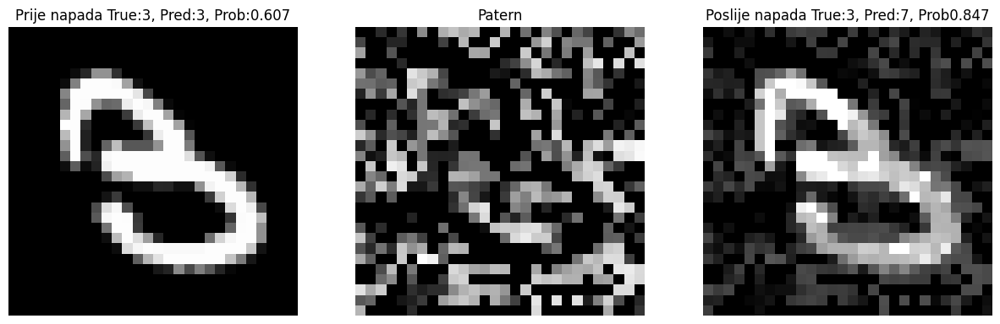

In [231]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_test_mnist[18], Y_test_mnist[18], mali_mnist, target_index=7, broj_iteracija=300)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_test_mnist[18], mali_mnist, crno_bijelo=True)


1/1 [==============================] - 0s 13ms/step


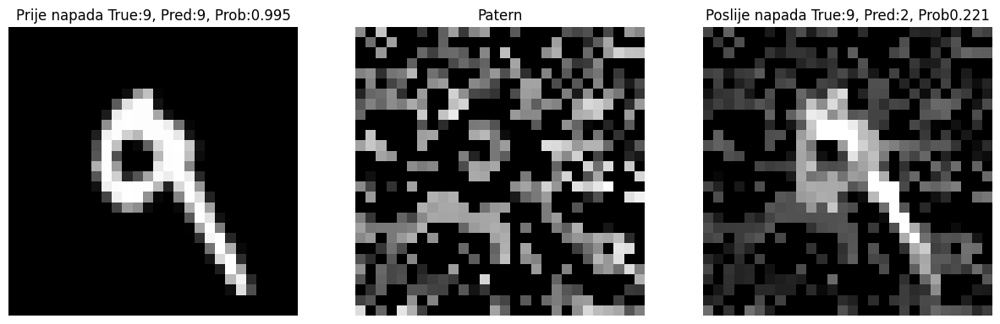

In [232]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_test_mnist[7], Y_test_mnist[7], mali_mnist, target_index=7, eps=0.0022)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_test_mnist[7], mali_mnist, crno_bijelo=True)

1/1 [==============================] - 0s 17ms/step


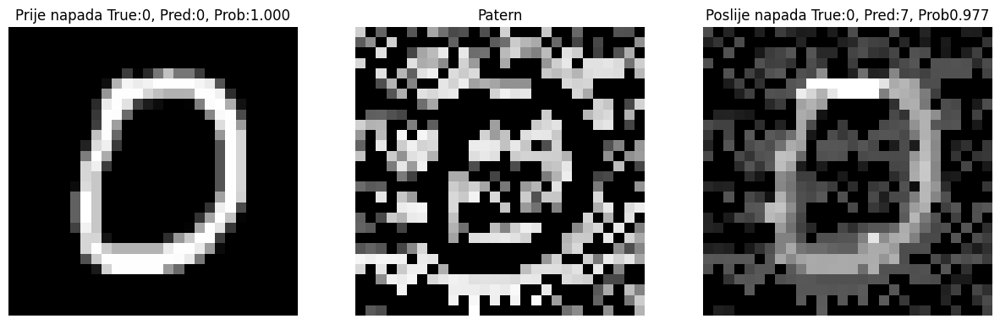

In [233]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_test_mnist[10], Y_test_mnist[10], mali_mnist, target_index=7, eps=0.001, broj_iteracija=200)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_test_mnist[10], mali_mnist, crno_bijelo=True)

Primjetimo da su veoma velike promjene, to je zbog toga što je slika crnobijela i istovremeno slike su male rezolucije sada radimo isti postupak ali se scale upamo slike

In [234]:
X_train_big_mnist = X_train_mnist.reshape((-1, 28, 28, 1))
X_train_big_mnist = tf.image.resize(X_train_big_mnist, (128, 128))
X_train_big_mnist = X_train_big_mnist.numpy()
X_train_big_mnist = X_train_big_mnist.reshape((-1, 128, 128, 1))

X_test_big_mnist = X_test_mnist.reshape((-1, 28, 28, 1))
X_test_big_mnist = tf.image.resize(X_test_big_mnist, (128, 128))
X_test_big_mnist = X_test_big_mnist.numpy()
X_test_big_mnist = X_test_big_mnist.reshape((-1, 128, 128, 1))

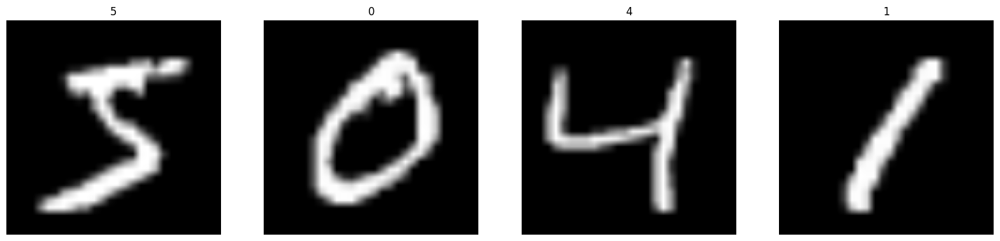

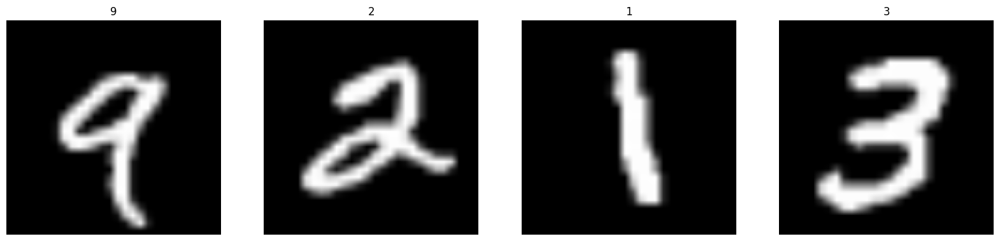

In [235]:
prikazi_slike(X_train_big_mnist[:4], Y_train_mnist[:4], True)
prikazi_slike(X_train_big_mnist[4:8], Y_train_mnist[4:8], True)

In [236]:
veliki_mnist=napravi_sample_model()

In [237]:
history = veliki_mnist.fit(X_train_big_mnist, Y_train_mnist, validation_data=(X_test_big_mnist, Y_test_mnist), epochs=2, batch_size=256)

Epoch 1/2
235/235 [==============================] - 131s 546ms/step - loss: 0.2638 - accuracy: 0.9169 - val_loss: 0.0713 - val_accuracy: 0.9783
Epoch 2/2
235/235 [==============================] - 120s 510ms/step - loss: 0.0789 - accuracy: 0.9761 - val_loss: 0.0556 - val_accuracy: 0.9843


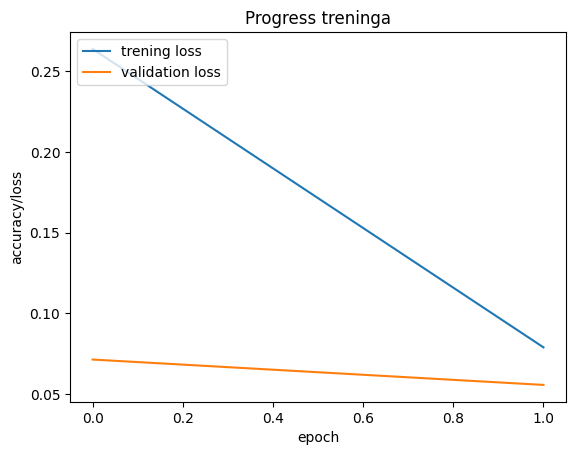

In [238]:
iscrtaj_model(history)

**Rezultati scale-upanog modela za mnist**

1/1 [==============================] - 0s 15ms/step


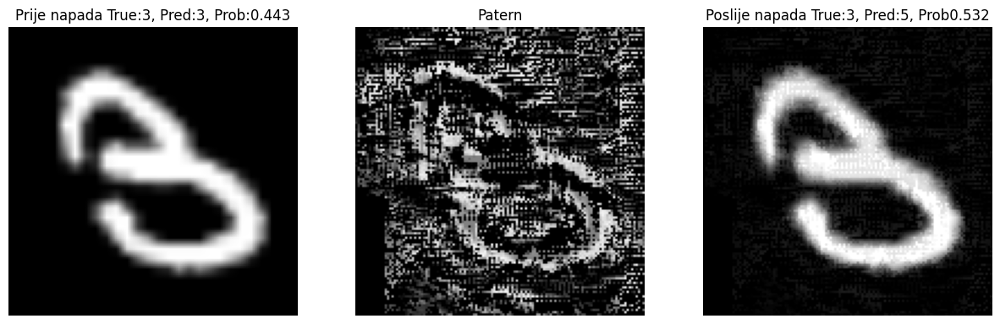

In [239]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_test_big_mnist[18], Y_test_mnist[18], veliki_mnist, eps=0.0005)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_test_mnist[18], veliki_mnist, crno_bijelo=True)

1/1 [==============================] - 0s 14ms/step


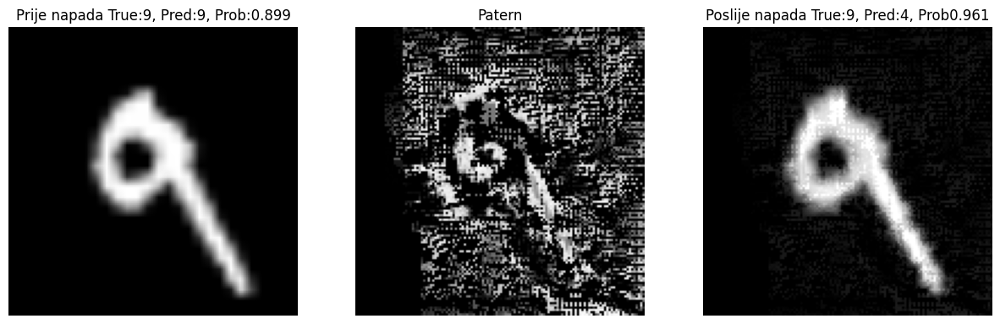

In [240]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_test_big_mnist[7], Y_test_mnist[7], veliki_mnist, eps=0.0005)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_test_mnist[7], veliki_mnist, crno_bijelo=True)

1/1 [==============================] - 0s 14ms/step


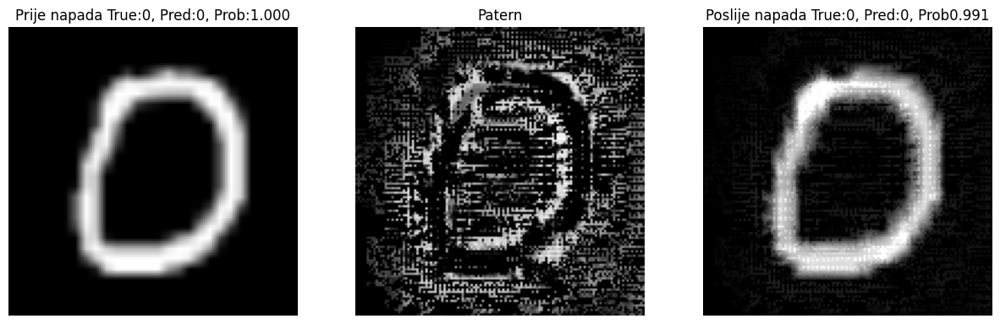

In [241]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_test_big_mnist[10], Y_test_mnist[10], veliki_mnist, broj_iteracija=125)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_test_mnist[10], veliki_mnist, crno_bijelo=True)

1/1 [==============================] - 0s 14ms/step


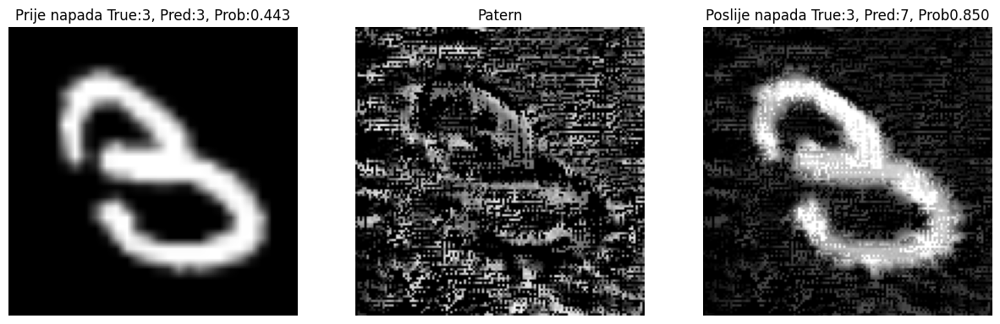

In [242]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_test_big_mnist[18], Y_test_mnist[18], veliki_mnist, target_index=7, eps=0.0007, broj_iteracija=200)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_test_mnist[18], veliki_mnist, crno_bijelo=True)


1/1 [==============================] - 0s 16ms/step


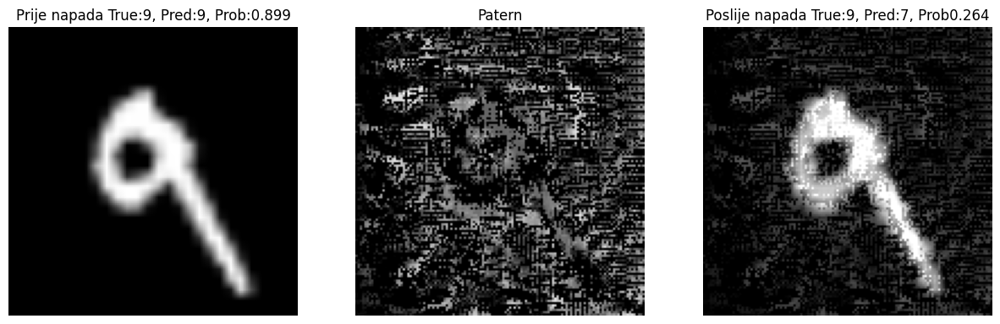

In [243]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_test_big_mnist[7], Y_test_mnist[7], veliki_mnist, target_index=7, eps=0.0007 ,broj_iteracija=210)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_test_mnist[7], veliki_mnist, crno_bijelo=True)

1/1 [==============================] - 0s 14ms/step


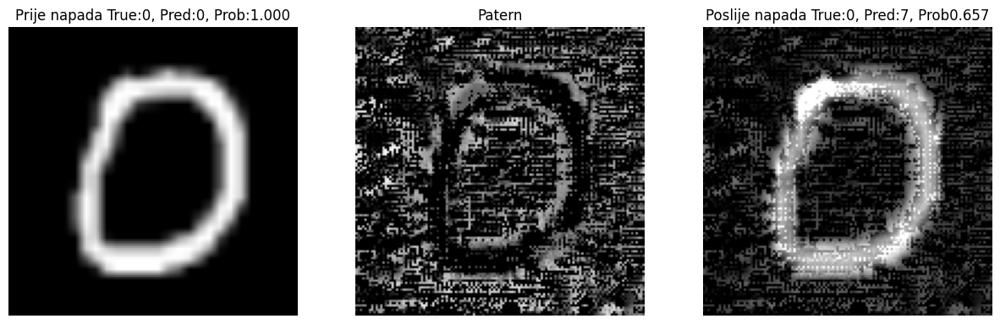

In [244]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_test_big_mnist[10], Y_test_mnist[10], veliki_mnist, target_index=7, eps=0.0007, broj_iteracija=240)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_test_mnist[10], veliki_mnist, crno_bijelo=True)

I dalje vidimo da su malo primjetne razlike, sada koristimo cifar koji je male rezulucije ali su slike u boji pa gradijent pomjeranja je širi

In [245]:
(X_train_cifar, Y_train_cifar), (X_test_cifar, Y_test_cifar) = tf.keras.datasets.cifar10.load_data()

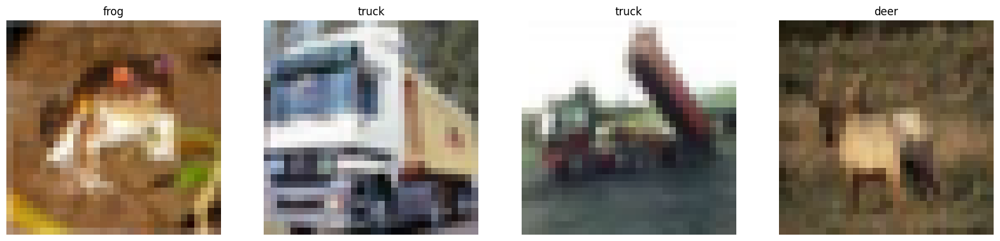

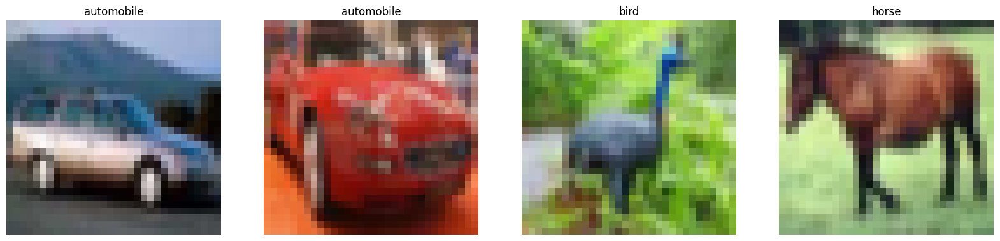

In [246]:
mapa_cifra = ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"]
labels = [mapa_cifra[el[0]] for el in Y_train_cifar[:8]]
prikazi_slike(X_train_cifar[:4], labels[:4])
prikazi_slike(X_train_cifar[4:8], labels[4:8])

In [247]:
X_train_cifar, X_test_cifar = X_train_cifar / 255.0, X_test_cifar / 255.0

In [248]:
zivotinje_model = napravi_sample_model()
history = zivotinje_model.fit(X_train_cifar, Y_train_cifar, validation_data=(X_test_cifar, Y_test_cifar), batch_size=256, epochs=30)

Epoch 1/30
196/196 [==============================] - 9s 42ms/step - loss: 1.8331 - accuracy: 0.3126 - val_loss: 1.4926 - val_accuracy: 0.4521
Epoch 2/30
196/196 [==============================] - 8s 39ms/step - loss: 1.4161 - accuracy: 0.4825 - val_loss: 1.2485 - val_accuracy: 0.5504
Epoch 3/30
196/196 [==============================] - 8s 39ms/step - loss: 1.2411 - accuracy: 0.5539 - val_loss: 1.0719 - val_accuracy: 0.6162
Epoch 4/30
196/196 [==============================] - 8s 39ms/step - loss: 1.1223 - accuracy: 0.6035 - val_loss: 0.9897 - val_accuracy: 0.6481
Epoch 5/30
196/196 [==============================] - 8s 39ms/step - loss: 1.0360 - accuracy: 0.6332 - val_loss: 0.9212 - val_accuracy: 0.6705
Epoch 6/30
196/196 [==============================] - 8s 39ms/step - loss: 0.9682 - accuracy: 0.6580 - val_loss: 0.8415 - val_accuracy: 0.7057
Epoch 7/30
196/196 [==============================] - 8s 39ms/step - loss: 0.9192 - accuracy: 0.6773 - val_loss: 0.8008 - val_accuracy: 0.7201

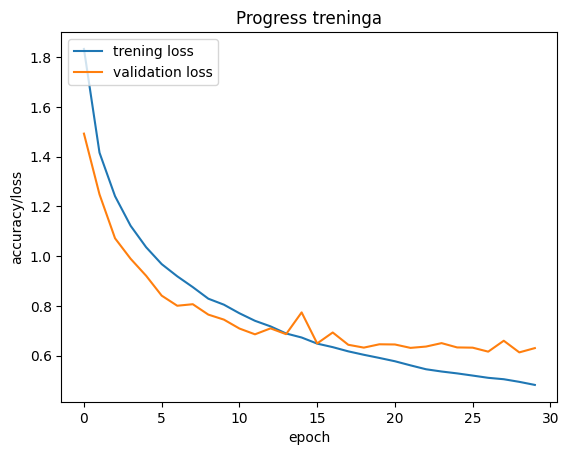

In [249]:
iscrtaj_model(history)

In [250]:
def u_cifar(el):
    return mapa_cifra[el]

**Rezultati Cifra**
Vidimo je veome teško uočiti razliku u slikama

1/1 [==============================] - 0s 13ms/step


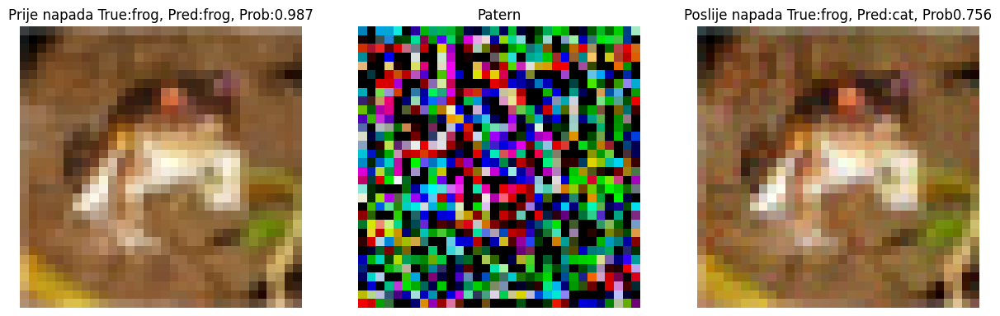

In [251]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_train_cifar[0], Y_train_cifar[0][0], zivotinje_model, eps=0.0002)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_train_cifar[0][0], zivotinje_model, to_index=u_cifar)

1/1 [==============================] - 0s 12ms/step


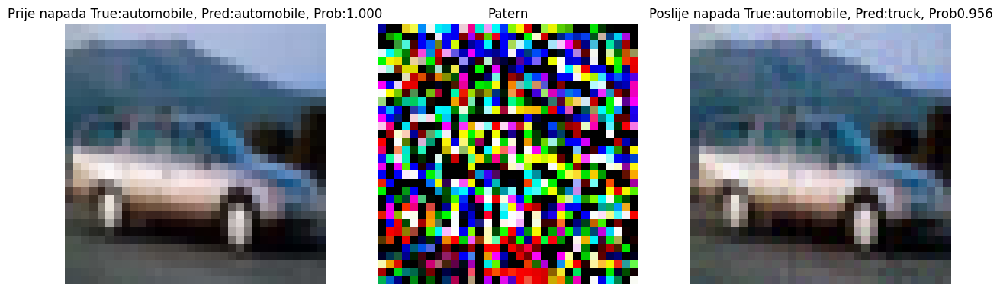

In [252]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_train_cifar[4], Y_train_cifar[4][0], zivotinje_model, eps=0.0001)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_train_cifar[4][0], zivotinje_model, to_index=u_cifar)

1/1 [==============================] - 0s 16ms/step


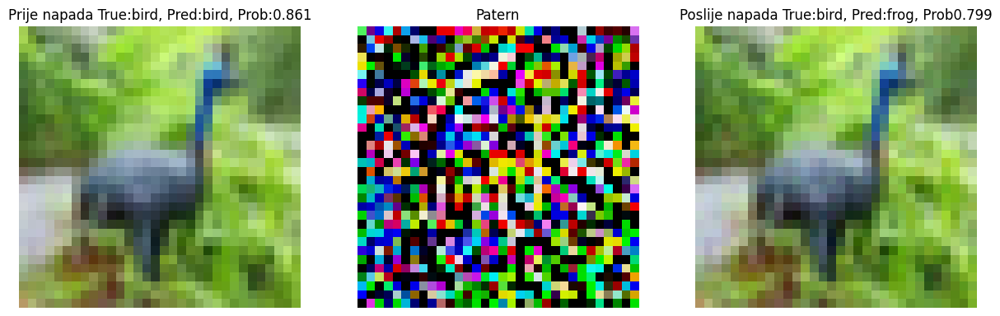

In [253]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_train_cifar[6], Y_train_cifar[6][0], zivotinje_model, eps=0.0001)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_train_cifar[6][0], zivotinje_model, to_index=u_cifar)

1/1 [==============================] - 0s 14ms/step


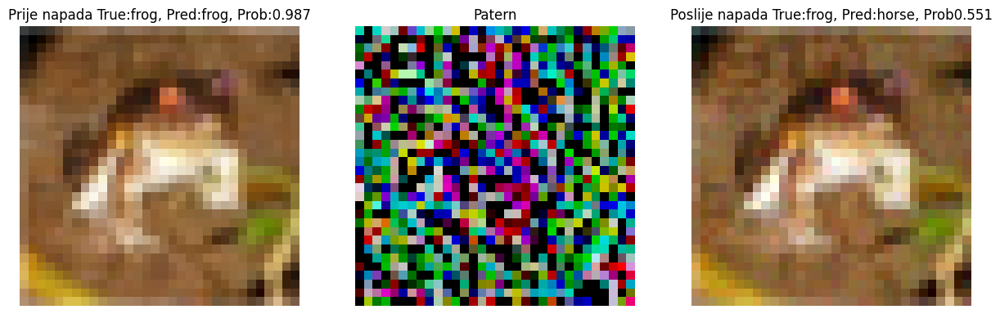

In [254]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_train_cifar[0], Y_train_cifar[0][0], zivotinje_model, eps=0.0002, target_index=7)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_train_cifar[0][0], zivotinje_model, to_index=u_cifar)

1/1 [==============================] - 0s 12ms/step


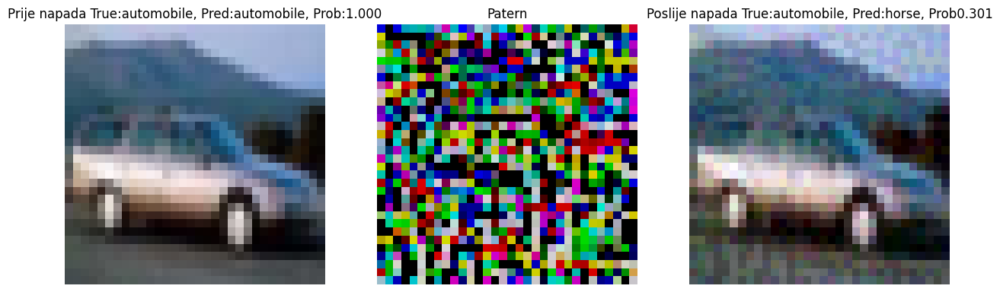

In [255]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_train_cifar[4], Y_train_cifar[4][0], zivotinje_model, eps=0.0003, target_index=7)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_train_cifar[4][0], zivotinje_model, to_index=u_cifar)

1/1 [==============================] - 0s 16ms/step


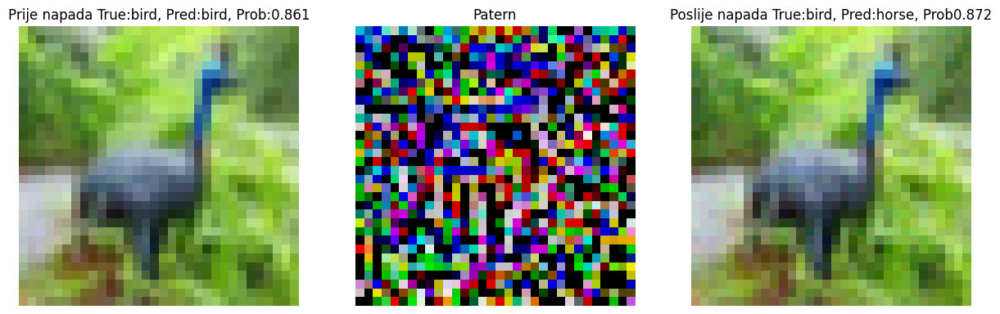

In [256]:
orginal, pomjeranja, nakon_napada_slika = uradi_napad(X_train_cifar[6], Y_train_cifar[6][0], zivotinje_model, eps=0.0002, target_index=7)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_train_cifar[6][0], zivotinje_model, to_index=u_cifar)

Sada posmatrajmo i velike slike i u boji, pa koristimo flower dataset

In [257]:
training_flower_data, testing_flower_data = tfds.load(
    "tf_flowers",
    split=["train[:85%]", "train[85%:]"],
    as_supervised=True
)

In [258]:
mapa_cvijeca = ["daisy", "dandelion", "roses", "sunflowers", "tulips"]

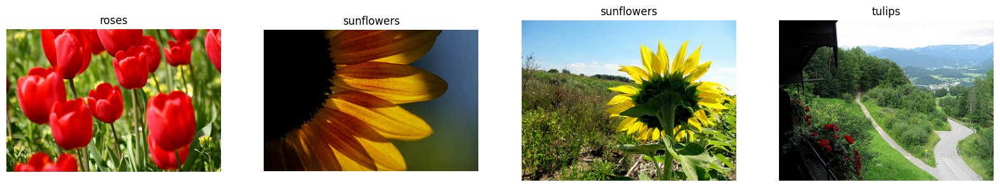

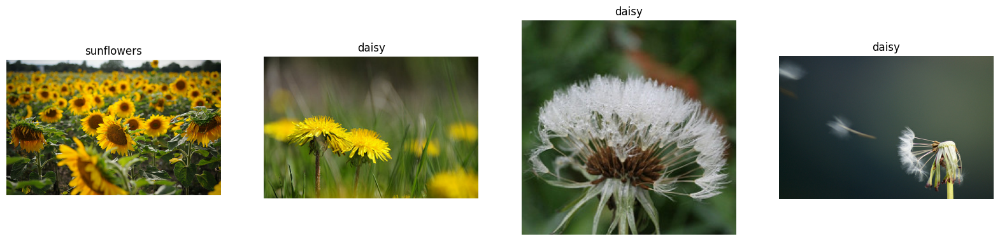

In [259]:
slike = []
labele = []
for i, (slika, labela) in enumerate(training_flower_data.take(8)):
    slike.append(slika)
    labele.append(mapa_cvijeca[int(labela)])

prikazi_slike(slike[:4], labele[:4])
prikazi_slike(slike[4:8], labele[4:8])

In [260]:
def preprocesuj_sliku(slika, labela):
    slika = tf.image.convert_image_dtype(slika, tf.float32)
    slika = tf.image.resize(slika, (224, 224))
    return (slika, labela)
# Construct TensorFlow dataset
AUTO = tf.data.experimental.AUTOTUNE

training_flower_data = (
    training_flower_data
    .map(preprocesuj_sliku, num_parallel_calls=AUTO)
    .cache()
    .shuffle(1024)
    .batch(64)
    .prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
)

testing_flower_data = (
    testing_flower_data
    .map(preprocesuj_sliku, num_parallel_calls=AUTO)
    .cache()
    .batch(64)
    .prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
)

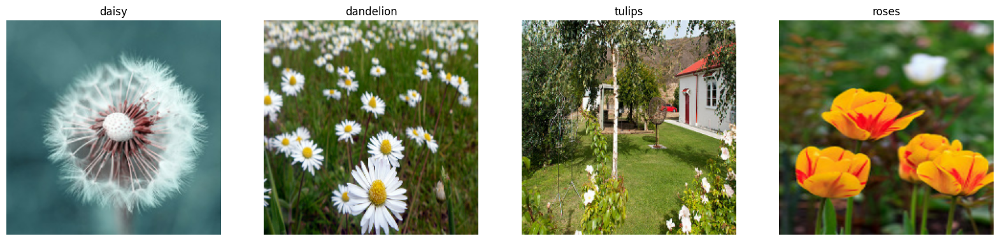

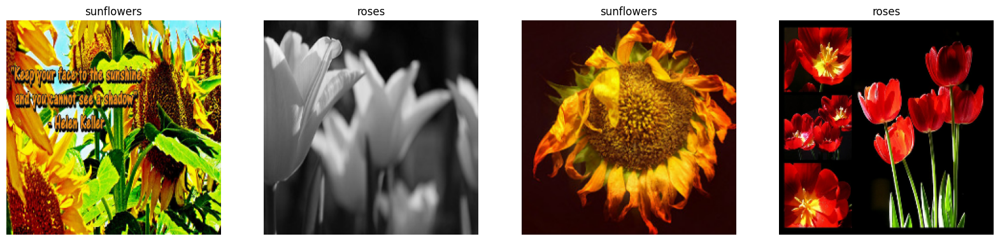

In [261]:
slike = []
labele = []
for i, (slika, labela) in enumerate(training_flower_data.take(8)):
    slike.append(slika[i])
    labele.append(mapa_cvijeca[int(labela[i])])

prikazi_slike(slike[:4], labele[:4])
prikazi_slike(slike[4:8], labele[4:8])

In [262]:
flower_model = napravi_sample_model()
history = flower_model.fit(training_flower_data, validation_data=testing_flower_data, batch_size=256, epochs=10)

Epoch 1/10
49/49 [==============================] - 27s 513ms/step - loss: 2.4644 - accuracy: 0.2157 - val_loss: 1.6764 - val_accuracy: 0.2909
Epoch 2/10
49/49 [==============================] - 24s 495ms/step - loss: 1.4314 - accuracy: 0.3699 - val_loss: 1.2464 - val_accuracy: 0.5327
Epoch 3/10
49/49 [==============================] - 24s 490ms/step - loss: 1.2304 - accuracy: 0.4692 - val_loss: 1.2264 - val_accuracy: 0.5418
Epoch 4/10
49/49 [==============================] - 25s 505ms/step - loss: 1.1593 - accuracy: 0.5237 - val_loss: 1.1787 - val_accuracy: 0.4855
Epoch 5/10
49/49 [==============================] - 25s 501ms/step - loss: 1.0994 - accuracy: 0.5465 - val_loss: 1.1422 - val_accuracy: 0.5327
Epoch 6/10
49/49 [==============================] - 24s 494ms/step - loss: 0.9963 - accuracy: 0.6096 - val_loss: 1.0172 - val_accuracy: 0.5673
Epoch 7/10
49/49 [==============================] - 24s 490ms/step - loss: 0.9591 - accuracy: 0.6276 - val_loss: 1.0230 - val_accuracy: 0.5855

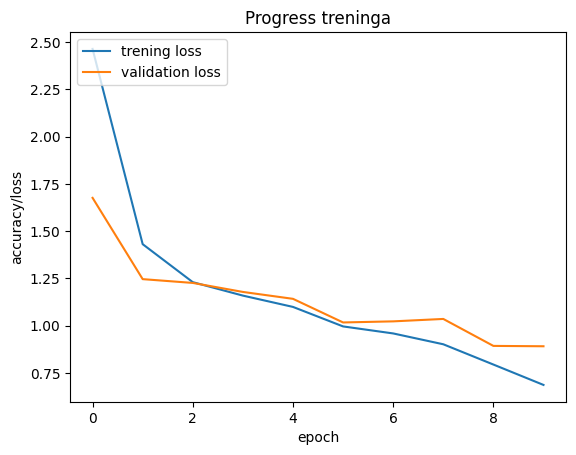

In [263]:
iscrtaj_model(history)

Ovu sliku ćemo koristiti u testuranju

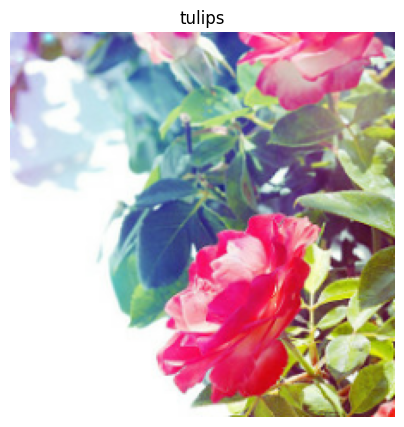

In [264]:
izabrana_slika = ""
izabrana_labela = ""
for i, (slika, labela) in enumerate(training_flower_data.take(1)):
    izabrana_slika = slika[i]
    izabrana_labela = int(labela[i])
prikazi_slike([izabrana_slika], [mapa_cvijeca[izabrana_labela]])

**Rezultati Flowers**
Vidimo da razlike u suštini nema

1/1 [==============================] - 0s 23ms/step


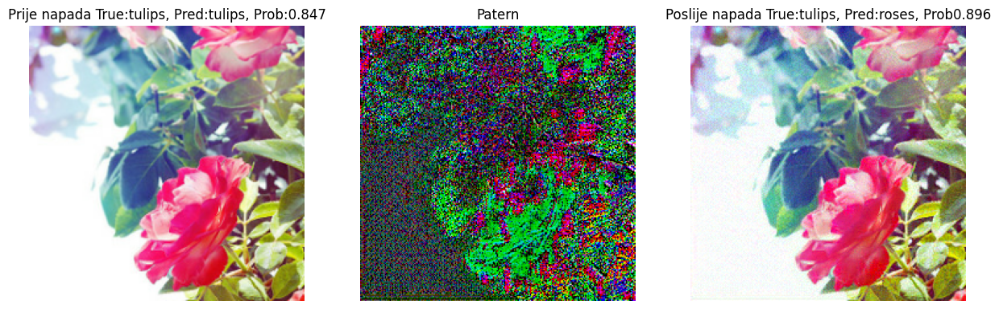

In [313]:
def u_cvijet(el):
    return mapa_cvijeca[el]
orginal, pomjeranja, nakon_napada_slika = uradi_napad(izabrana_slika, izabrana_labela, flower_model, eps=0.0003)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, izabrana_labela, flower_model, to_index=u_cvijet)

Sada ćemo napraviti dataset gdje je svaka slika ovako augmentirama da vidimo koji accuracy ima naš model

In [266]:
#Testiraj sa sporim napadima
X_slow_attack = []
for i in range(30):
    _, _, nakon_napada_slika = uradi_napad(X_test_cifar[i], Y_test_cifar[i][0], zivotinje_model, eps=0.0001)
    nakon_napada_slika = nakon_napada_slika[0]
    X_slow_attack.append(nakon_napada_slika)
X_slow_attack = np.array(X_slow_attack)

In [267]:
def evaluiraj_model(kontrolni_skup, eksperimenti_skup, labele, model):
    broj_elemenata = len(eksperimenti_skup)
    kontrolni_rezultati = model.evaluate(kontrolni_skup[:broj_elemenata], labele[:broj_elemenata], verbose=0)

    eksperimentni_rezultati = model.evaluate(eksperimenti_skup[:broj_elemenata], labele[:broj_elemenata], verbose=0)

    print("Orginalne slike:")
    print("Loss:", kontrolni_rezultati[0])
    for i, metric_name in enumerate(model.metrics_names[1:]):
        print(f"{metric_name}: {kontrolni_rezultati[i + 1]}")

    print("\nSlike nakon napada:")
    print("Loss:", eksperimentni_rezultati[0])
    for i, metric_name in enumerate(model.metrics_names[1:]):
        print(f"{metric_name}: {eksperimentni_rezultati[i + 1]}")

Primjetimo da je model veoma loš na ovim primjerima

In [268]:
evaluiraj_model(X_test_cifar, X_slow_attack, Y_test_cifar, zivotinje_model)

Orginalne slike:
Loss: 0.29732978343963623
accuracy: 0.9333333373069763

Slike nakon napada:
Loss: 5.561366558074951
accuracy: 0.03333333507180214


**Brži napad**
Primjetili ste da pravljenje veoma malog dataseta je tražilo mnogo vremena, pa je cilj da ovo ubrzamo

In [269]:
#Ova funkcija za razliku od one spore samo generise znakove to jest koji pixel se treba povecat a koji smanjit, to radimo uzimanjem znaka gradijenta
def generisi_oznaku_pomjeranja(slika, labela_slike, model):
    loss_func = tf.keras.losses.SparseCategoricalCrossentropy()
    with tf.GradientTape() as tape:
        tape.watch(slika)
        prediction = model(slika, training=False)
        loss = loss_func(tf.convert_to_tensor([labela_slike]),prediction)

    gradients = tape.gradient(loss, slika)
    oznaka_gradijenta = tf.sign(gradients)

    return oznaka_gradijenta

def uradi_brzi_napad(slika, labela_slike, model, eps=0.02):
    slika = np.array([slika])
    tf_img = tf.convert_to_tensor(slika)

    oznaka_pomjeranja = generisi_oznaku_pomjeranja(tf_img, labela_slike, model)

    nakon_napada_slika = tf_img + eps * oznaka_pomjeranja
    nakon_napada_slika = tf.clip_by_value(nakon_napada_slika, clip_value_min=0, clip_value_max=1)

    oznaka_pomjeranja = tf.clip_by_value(oznaka_pomjeranja, clip_value_min=0, clip_value_max=1)
    return tf_img, oznaka_pomjeranja, nakon_napada_slika

**Rezultati brzog napada na cifru**
Vidimo da je malo primjetniji u odnosu na spori ali je dosta brži

1/1 [==============================] - 0s 15ms/step


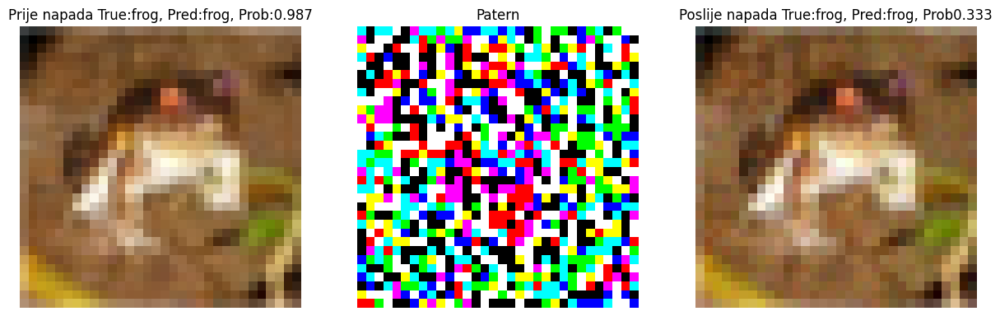

In [270]:
orginal, pomjeranja, nakon_napada_slika = uradi_brzi_napad(X_train_cifar[0], Y_train_cifar[0][0], zivotinje_model)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_train_cifar[0][0], zivotinje_model, to_index=u_cifar)

1/1 [==============================] - 0s 14ms/step


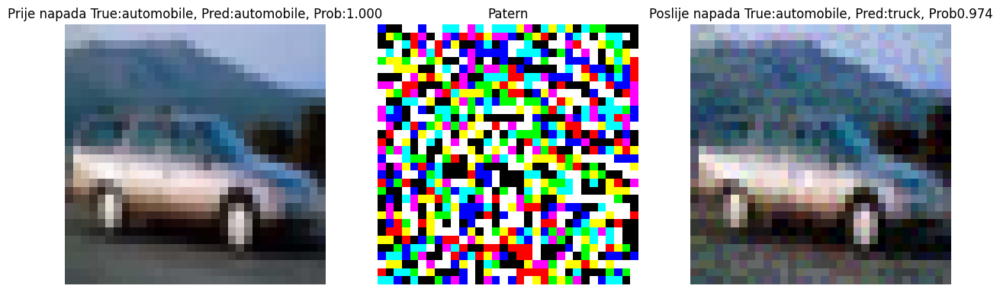

In [271]:
orginal, pomjeranja, nakon_napada_slika = uradi_brzi_napad(X_train_cifar[4], Y_train_cifar[4][0], zivotinje_model, eps=0.04)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_train_cifar[4][0], zivotinje_model, to_index=u_cifar)

1/1 [==============================] - 0s 14ms/step


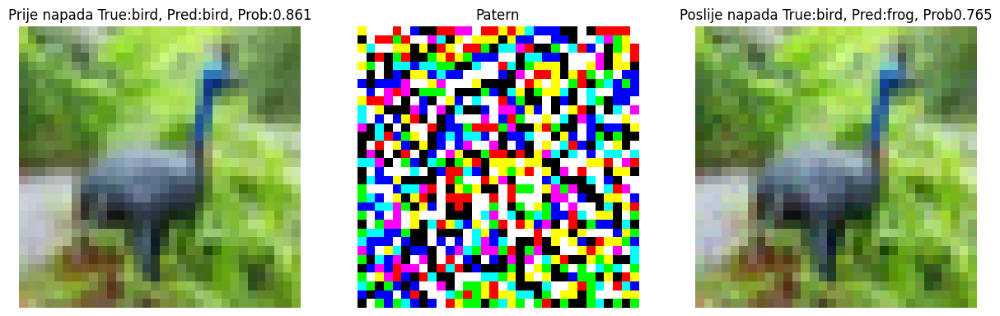

In [272]:
orginal, pomjeranja, nakon_napada_slika = uradi_brzi_napad(X_train_cifar[6], Y_train_cifar[6][0], zivotinje_model)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_train_cifar[6][0], zivotinje_model, to_index=u_cifar)

**Rezultati brzog na Flowers**
Vidimo da se na vecim slikama koje su u boji i dalje ne vidi razlika

1/1 [==============================] - 0s 15ms/step


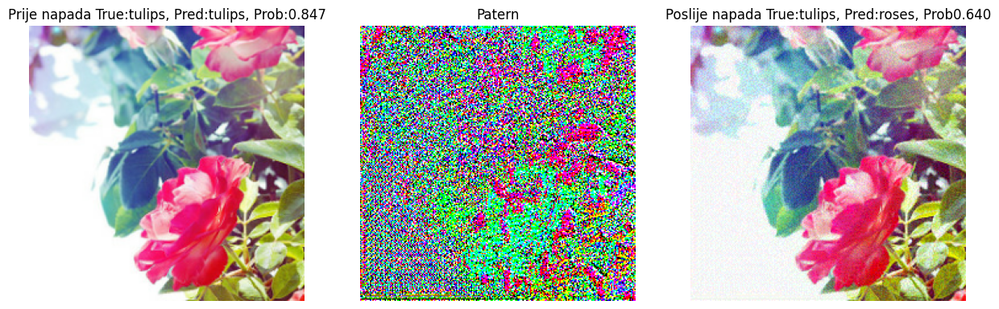

In [311]:
orginal, pomjeranja, nakon_napada_slika = uradi_brzi_napad(izabrana_slika, izabrana_labela, flower_model, eps=0.06)
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, izabrana_labela, flower_model, to_index=u_cvijet)

**Brzi napad**
Radimo isto kao sto smo na sporim pravimo dataset da vidimo accuracy

In [274]:
#Testiraj sa brzim napadom
X_fast_attack = []
for i in range(1000):
    _, _, nakon_napada_slika = uradi_brzi_napad(X_test_cifar[i], Y_test_cifar[i][0], zivotinje_model, eps=0.04)
    nakon_napada_slika = nakon_napada_slika[0]
    X_fast_attack.append(nakon_napada_slika)

X_fast_attack = np.array(X_fast_attack)

Vidimo da je malo bolji rezultat nego na sporom(što je očekivano) ali i dalje vemo loš

In [275]:
evaluiraj_model(X_test_cifar, X_fast_attack, Y_test_cifar, zivotinje_model)

Orginalne slike:
Loss: 0.6016733646392822
accuracy: 0.7960000038146973

Slike nakon napada:
Loss: 5.081640243530273
accuracy: 0.08799999952316284


Ovi napadi se također mogu raditi sa bibliotekom foolbox

In [276]:
#Najbrzi napad fool box
model = ResNet50(weights="imagenet")

In [277]:
preprocesiranje = dict(flip_axis=-1, mean=[104.0, 116.0, 123.0])
foolbox_model = fb.TensorFlowModel(model, bounds=(0, 255), preprocessing=preprocesiranje)
foolbox_model = foolbox_model.transform_bounds((0, 1))

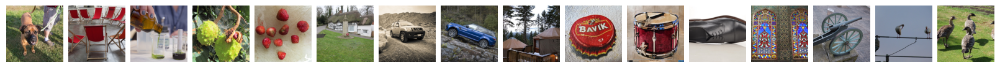

In [278]:
slike, labele = fb.utils.samples(foolbox_model, dataset="imagenet", batchsize=16)
fb.plot.images(slike)

In [279]:
clean_accuracy = fb.utils.accuracy(foolbox_model, slike, labele)
print(f"Clean accuracy: {clean_accuracy:.2f}")

Clean accuracy: 0.88


In [280]:
attack = fb.attacks.LinfDeepFoolAttack()
nakon_napada_slike, _, je_fulio = attack(foolbox_model, slike, labele, epsilons=0.03)


In [281]:
new_accuracy = 1 - je_fulio.numpy().mean(axis=-1)
print(f"Accuracy after attack: {new_accuracy:.3f}")

Accuracy after attack: 0.000


Vidimo da su neke slike skroz uništene pa trebaju se bolje namjestiti neki parametri, razlog što nisam koristio naš model i naše datasetove je iz razloga što još nije implementiran dobar dio ove biblioteke

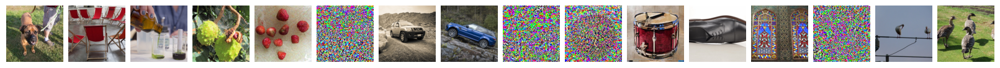

In [282]:
fb.plot.images(nakon_napada_slike)

# Black Box Attack
Sada ćemo raditi napad ali bez da znamo išta o mreži nego da samo možemo slati upite.
Ovo ćemo postići genetičkim algoritmom

In [283]:

def upitaj_model(slika):
    prediction = zivotinje_model(slika)
    return prediction

#Izmjesa matrice tako što na poziciju [i][j] stavi ili element od a ili element od b
def izmjesaj_matrice(a, b):
    mask = np.random.choice([0, 1], size=a.shape)
    result = np.where(mask, a, b)
    return result


#napravi mnogo random matrica i genetički pokušava da nađe nešto kao gradijent, fitness funckija je udaljavnje od predikcije koju bi trebao pogoditi
def generisi_upitni_gradijent_pomjeranja(slika, target_index, broj_iteracija=100, eps=0.1):
    slika = tf.convert_to_tensor(slika)
    broj_populacije = 1000
    populacija = []
    pomjeranja = []
    for i in range(broj_populacije):
        frajer = tf.random.uniform(slika.shape, minval=-eps, maxval=eps, dtype=tf.double)
        populacija.append(frajer)

    for i in range(broj_iteracija):
        jaki = []
        for j in range(broj_populacije):
            input = slika + populacija[j]
            input = tf.clip_by_value(input, clip_value_min=0, clip_value_max=1)
            predikcija = upitaj_model(input)
            jaki.append([populacija[j], predikcija[0][target_index]])

        jaki = sorted(jaki, key=lambda x: x[1])
        jaki = jaki[:(broj_populacije//2)]
        nova_populacija = []

        while len(nova_populacija) < len(populacija):
            pair = random.sample(jaki, 2)
            result = izmjesaj_matrice(pair[0][0], pair[1][0])
            nova_populacija.append(result)

        print("Iteracija:", i , "accuracy:", float(jaki[0][1]))
        pomjeranja = jaki[0][0]
        populacija = nova_populacija

    return pomjeranja

def uradi_upitni_napad(slika, target_index, broj_iteracija=50, eps=0.1):
    slika = np.array([slika])
    tf_img = tf.convert_to_tensor(slika)
    tf_img = tf.clip_by_value(tf_img, clip_value_min=0, clip_value_max=1)

    pomjeranja = generisi_upitni_gradijent_pomjeranja(tf_img, target_index, broj_iteracija, eps)
    nakon_napada_slika = tf_img + pomjeranja
    nakon_napada_slika = tf.clip_by_value(nakon_napada_slika, clip_value_min=0, clip_value_max=1)

    pomjeranja = tf.clip_by_value(pomjeranja, clip_value_min=0, clip_value_max=1)

    return tf_img, pomjeranja, nakon_napada_slika

Vidimo da je rezultat loš u odnosu na sve dosad, ali nismo znali ništa o mreži

Iteracija: 0 accuracy: 0.9715534448623657
Iteracija: 1 accuracy: 0.9676177501678467
Iteracija: 2 accuracy: 0.9582335948944092
Iteracija: 3 accuracy: 0.9429028630256653
Iteracija: 4 accuracy: 0.9186614155769348
Iteracija: 5 accuracy: 0.8966436386108398
Iteracija: 6 accuracy: 0.9047582149505615
Iteracija: 7 accuracy: 0.8698403239250183
Iteracija: 8 accuracy: 0.8245681524276733
Iteracija: 9 accuracy: 0.8305342793464661
Iteracija: 10 accuracy: 0.78749680519104
Iteracija: 11 accuracy: 0.7784355282783508
Iteracija: 12 accuracy: 0.7338849902153015
Iteracija: 13 accuracy: 0.7235643863677979
Iteracija: 14 accuracy: 0.6371058821678162
Iteracija: 15 accuracy: 0.6211817264556885
Iteracija: 16 accuracy: 0.6063522100448608
Iteracija: 17 accuracy: 0.5339211225509644
Iteracija: 18 accuracy: 0.45077136158943176
Iteracija: 19 accuracy: 0.42885372042655945
Iteracija: 20 accuracy: 0.3639295995235443
Iteracija: 21 accuracy: 0.3041316568851471
Iteracija: 22 accuracy: 0.2576662302017212
Iteracija: 23 accurac

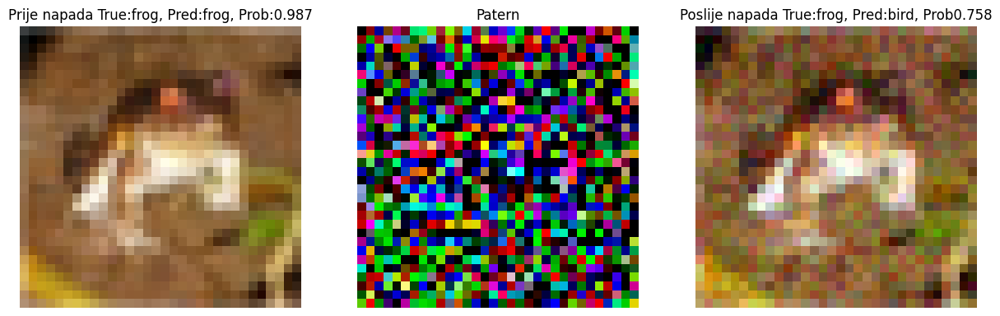

In [284]:
orginal, pomjeranja, nakon_napada_slika = uradi_upitni_napad(X_train_cifar[0], Y_train_cifar[0][0])
vizualiziraj_rezultat(orginal, pomjeranja, nakon_napada_slika, Y_train_cifar[0][0], zivotinje_model, to_index=u_cifar)

Ako čak ne možemo slati ni upite često se ovakve slike prenose sa mreže na mrežu ako su dovoljno slične

In [285]:
#Pokazi prenosenje na mreze
def napravi_slican_sample_model():
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Conv2D(64, (3, 3), padding="same", activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Conv2D(128, (3, 3), padding="same", activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(512, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Dense(256, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Dense(128, activation='relu'))
    model.add(tf.keras.layers.Dense(10, activation='softmax'))
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

slican_model = napravi_slican_sample_model()

In [286]:
history = slican_model.fit(X_train_cifar, Y_train_cifar, validation_data=(X_test_cifar, Y_test_cifar), batch_size=256, epochs=11)

Epoch 1/11
196/196 [==============================] - 17s 81ms/step - loss: 1.7288 - accuracy: 0.3584 - val_loss: 1.3684 - val_accuracy: 0.5061
Epoch 2/11
196/196 [==============================] - 15s 79ms/step - loss: 1.2909 - accuracy: 0.5343 - val_loss: 1.1121 - val_accuracy: 0.6064
Epoch 3/11
196/196 [==============================] - 15s 79ms/step - loss: 1.1050 - accuracy: 0.6079 - val_loss: 0.9797 - val_accuracy: 0.6509
Epoch 4/11
196/196 [==============================] - 15s 78ms/step - loss: 0.9932 - accuracy: 0.6496 - val_loss: 0.9432 - val_accuracy: 0.6656
Epoch 5/11
196/196 [==============================] - 16s 79ms/step - loss: 0.9108 - accuracy: 0.6782 - val_loss: 0.8588 - val_accuracy: 0.7029
Epoch 6/11
196/196 [==============================] - 16s 79ms/step - loss: 0.8365 - accuracy: 0.7044 - val_loss: 0.8207 - val_accuracy: 0.7181
Epoch 7/11
196/196 [==============================] - 15s 78ms/step - loss: 0.7819 - accuracy: 0.7242 - val_loss: 0.8373 - val_accuracy:

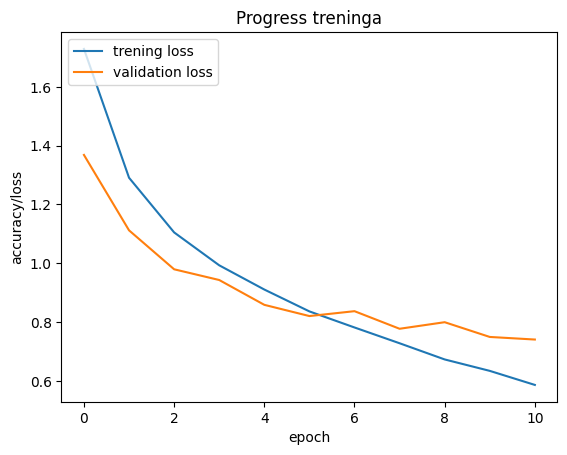

In [287]:
iscrtaj_model(history)

Vidimo da je model koji je dosta sličan, znatno prevaren, nije baš kao orginalni ali i dalje je dobro

In [288]:
evaluiraj_model(X_test_cifar, X_fast_attack, Y_test_cifar, slican_model)

Orginalne slike:
Loss: 0.7260273694992065
accuracy: 0.7519999742507935

Slike nakon napada:
Loss: 1.7639216184616089
accuracy: 0.44200000166893005


In [289]:
evaluiraj_model(X_test_cifar, X_slow_attack, Y_test_cifar, slican_model)

Orginalne slike:
Loss: 0.43643054366111755
accuracy: 0.8666666746139526

Slike nakon napada:
Loss: 0.9008751511573792
accuracy: 0.7333333492279053


In [290]:
vgg16_model = VGG16(weights='imagenet',
                    include_top=False,
                    classes=10,
                    input_shape=(32,32,3)
                   )
moj_vgg = tf.keras.Sequential()
for layer in vgg16_model.layers:
    moj_vgg.add(layer)

In [291]:
moj_vgg.add(tf.keras.layers.Flatten())
moj_vgg.add(tf.keras.layers.Dense(512, activation='relu', name='hidden1'))
moj_vgg.add(tf.keras.layers.Dropout(0.4))
moj_vgg.add(tf.keras.layers.Dense(256, activation='relu', name='hidden2'))
moj_vgg.add(tf.keras.layers.Dropout(0.4))
moj_vgg.add(tf.keras.layers.Dense(10, activation='softmax', name='predictions'))

moj_vgg.summary()

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 32, 32, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 32, 32, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 16, 16, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 16, 16, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 16, 16, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 8, 8, 128)         0         
                                                                 
 block3_conv1 (Conv2D)       (None, 8, 8, 256)       

In [292]:
moj_vgg.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

In [293]:
history = moj_vgg.fit(X_train_cifar, Y_train_cifar, validation_data=(X_test_cifar, Y_test_cifar), batch_size=256, epochs=8)

Epoch 1/8
196/196 [==============================] - 127s 639ms/step - loss: 1.9846 - accuracy: 0.1979 - val_loss: 1.7799 - val_accuracy: 0.2963
Epoch 2/8
196/196 [==============================] - 125s 640ms/step - loss: 1.5064 - accuracy: 0.4071 - val_loss: 1.1605 - val_accuracy: 0.5557
Epoch 3/8
196/196 [==============================] - 125s 638ms/step - loss: 1.0591 - accuracy: 0.6289 - val_loss: 0.9762 - val_accuracy: 0.6632
Epoch 4/8
196/196 [==============================] - 125s 636ms/step - loss: 0.8103 - accuracy: 0.7301 - val_loss: 0.8416 - val_accuracy: 0.7206
Epoch 5/8
196/196 [==============================] - 125s 637ms/step - loss: 0.6464 - accuracy: 0.7911 - val_loss: 0.7378 - val_accuracy: 0.7622
Epoch 6/8
196/196 [==============================] - 125s 637ms/step - loss: 0.5485 - accuracy: 0.8260 - val_loss: 0.7122 - val_accuracy: 0.7729
Epoch 7/8
196/196 [==============================] - 125s 639ms/step - loss: 0.4503 - accuracy: 0.8566 - val_loss: 0.7354 - val_ac

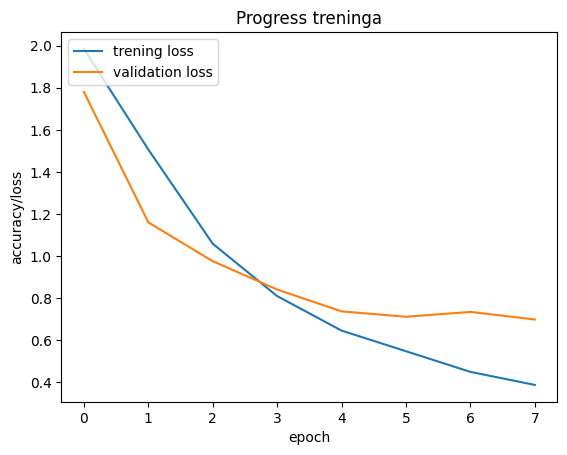

In [294]:
iscrtaj_model(history)

Čak je prevaren i model koji strukturno nije ni malo sličan orginalnom, ne mnogo ali i dalje osjetno

In [295]:
evaluiraj_model(X_test_cifar, X_fast_attack, Y_test_cifar, moj_vgg)

Orginalne slike:
Loss: 0.6572394967079163
accuracy: 0.7919999957084656

Slike nakon napada:
Loss: 2.202021598815918
accuracy: 0.492000013589859


In [296]:
evaluiraj_model(X_test_cifar, X_slow_attack, Y_test_cifar, moj_vgg)

Orginalne slike:
Loss: 0.780986487865448
accuracy: 0.8999999761581421

Slike nakon napada:
Loss: 1.412176251411438
accuracy: 0.7333333492279053


# Odbrana
Da bi se odbranili od ovih napada najintuitivnije rješenje bi bilo da mrežu treniramo na ovako generisanim primjerima
Pa ćemo to prvo i uraditi

In [297]:
X_train_brzi_napad = []
X_test_brzi_napad = []
for i in range(len(X_train_cifar)):
    _, _, slika = uradi_brzi_napad(X_train_cifar[i], Y_train_cifar[i][0], zivotinje_model)
    X_train_brzi_napad.append(slika[0])

for i in range(len(X_test_cifar)):
    _, _, slika = uradi_brzi_napad(X_test_cifar[i], Y_test_cifar[i][0], zivotinje_model)

    X_test_brzi_napad.append(slika[0])

In [298]:
X_mixed_train = np.concatenate([X_train_cifar, X_train_brzi_napad], axis=0)
Y_mixed_train = np.concatenate([Y_train_cifar, Y_train_cifar])

np.random.seed(42)
permutation = np.random.permutation(len(X_mixed_train))

X_mixed_train = X_mixed_train[permutation]
Y_mixed_train = Y_mixed_train[permutation]

X_mixed_test = np.concatenate([X_test_cifar, X_test_brzi_napad], axis=0)
Y_mixed_test = np.concatenate([Y_test_cifar, Y_test_cifar])

np.random.seed(42)
permutation = np.random.permutation(len(X_mixed_test))

X_mixed_test = X_mixed_test[permutation]
Y_mixed_test = Y_mixed_test[permutation]

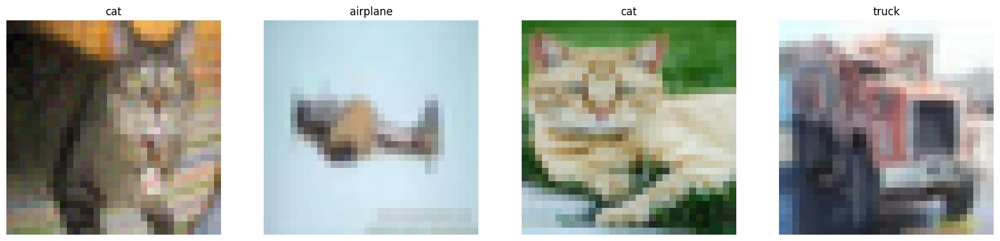

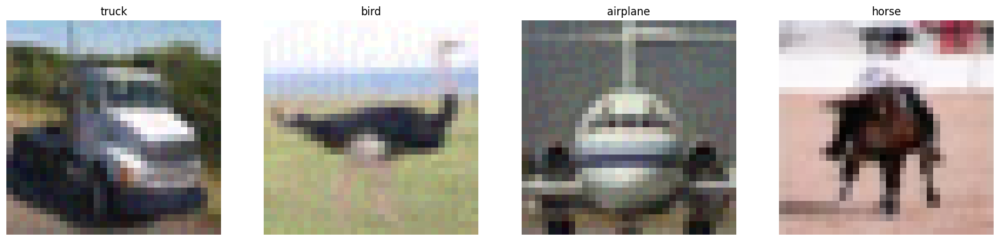

In [299]:
labele = [mapa_cifra[el[0]] for el in Y_mixed_test[:8]]
prikazi_slike(X_mixed_test[:4], labele[:4])
prikazi_slike(X_mixed_test[4:8], labele[4:8])

In [300]:
mixed_model = napravi_sample_model()
hist = mixed_model.fit(X_mixed_train, Y_mixed_train, validation_data=(X_mixed_test, Y_mixed_test), batch_size=256, epochs=20)

Epoch 1/20
391/391 [==============================] - 19s 46ms/step - loss: 1.6674 - accuracy: 0.3798 - val_loss: 1.3318 - val_accuracy: 0.5100
Epoch 2/20
391/391 [==============================] - 18s 47ms/step - loss: 1.3019 - accuracy: 0.5269 - val_loss: 1.1222 - val_accuracy: 0.5928
Epoch 3/20
391/391 [==============================] - 18s 45ms/step - loss: 1.1626 - accuracy: 0.5822 - val_loss: 1.0699 - val_accuracy: 0.6161
Epoch 4/20
391/391 [==============================] - 18s 45ms/step - loss: 1.0752 - accuracy: 0.6156 - val_loss: 0.9782 - val_accuracy: 0.6510
Epoch 5/20
391/391 [==============================] - 18s 45ms/step - loss: 1.0024 - accuracy: 0.6408 - val_loss: 0.9272 - val_accuracy: 0.6731
Epoch 6/20
391/391 [==============================] - 18s 45ms/step - loss: 0.9432 - accuracy: 0.6623 - val_loss: 0.9211 - val_accuracy: 0.6757
Epoch 7/20
391/391 [==============================] - 18s 45ms/step - loss: 0.8960 - accuracy: 0.6802 - val_loss: 0.8774 - val_accuracy:

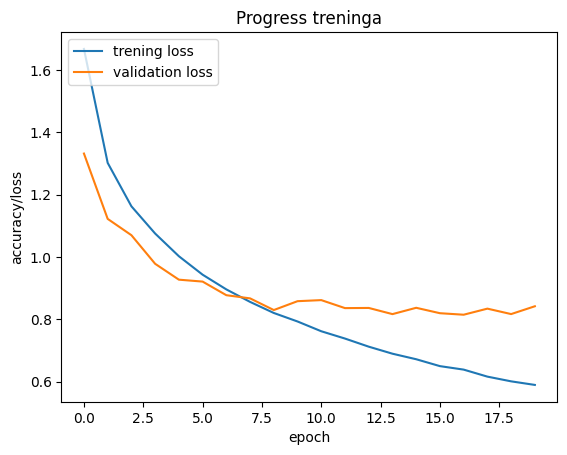

In [301]:
iscrtaj_model(hist)

In [302]:
X_test_brzi_napad = np.array(X_test_brzi_napad)

Vidimo da smo model odbranili fenomenalno, ali ovo je baš spor proces

In [303]:
evaluiraj_model(X_test_cifar, X_test_brzi_napad, Y_test_cifar, mixed_model)

Orginalne slike:
Loss: 0.7353420853614807
accuracy: 0.7491999864578247

Slike nakon napada:
Loss: 0.9485011696815491
accuracy: 0.684499979019165


In [304]:
evaluiraj_model(X_test_cifar, X_slow_attack, Y_test_cifar, mixed_model)

Orginalne slike:
Loss: 0.4382941424846649
accuracy: 0.8666666746139526

Slike nakon napada:
Loss: 0.5971287488937378
accuracy: 0.800000011920929


Da bi ubrzali ovaj proces koristimo neural selective Learning, to pravi adverserial primjere dok trenira.

In [305]:
nsl_model = napravi_sample_model((32,32,3))

adv_config = nsl.configs.make_adv_reg_config(multiplier=0.2, adv_step_size=0.05)
adv_model = nsl.keras.AdversarialRegularization(nsl_model, adv_config=adv_config)

adv_model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

In [306]:
history = adv_model.fit({'feature': X_train_cifar, 'label': Y_train_cifar}, batch_size=32, epochs=20)

Epoch 1/20
1563/1563 [==============================] - 34s 21ms/step - loss: 1.9634 - sparse_categorical_crossentropy: 1.6317 - sparse_categorical_accuracy: 0.3947 - scaled_adversarial_loss: 0.3317
Epoch 2/20
1563/1563 [==============================] - 32s 20ms/step - loss: 1.5332 - sparse_categorical_crossentropy: 1.2718 - sparse_categorical_accuracy: 0.5448 - scaled_adversarial_loss: 0.2614
Epoch 3/20
1563/1563 [==============================] - 32s 20ms/step - loss: 1.3587 - sparse_categorical_crossentropy: 1.1240 - sparse_categorical_accuracy: 0.6015 - scaled_adversarial_loss: 0.2347
Epoch 4/20
1563/1563 [==============================] - 32s 20ms/step - loss: 1.2486 - sparse_categorical_crossentropy: 1.0325 - sparse_categorical_accuracy: 0.6384 - scaled_adversarial_loss: 0.2161
Epoch 5/20
1563/1563 [==============================] - 32s 20ms/step - loss: 1.1716 - sparse_categorical_crossentropy: 0.9690 - sparse_categorical_accuracy: 0.6580 - scaled_adversarial_loss: 0.2027
Epoch

KeyError: 'val_loss'

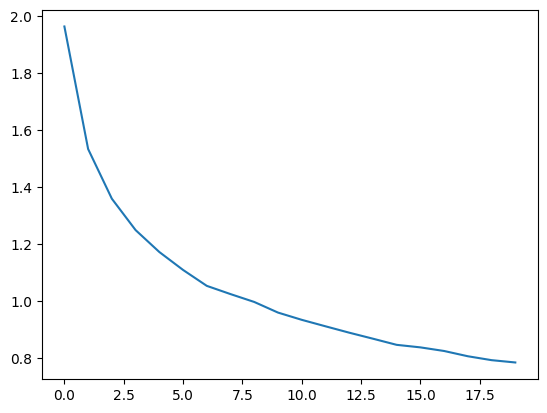

In [307]:
iscrtaj_model(history)

Vidimo da je i ovo dalo solidan rezultat ne baš kao gore ali sa obzirom na brzinu super je

In [308]:
evaluiraj_model(X_test_cifar, X_test_brzi_napad, Y_test_cifar, adv_model.base_model)

Orginalne slike:
Loss: 0.6700875759124756
accuracy: 0.7724999785423279

Slike nakon napada:
Loss: 1.397322177886963
accuracy: 0.5473999977111816
